# Quantization Aware Training (QAT)

References:

- [Quantization (PyTorch documentation)](https://pytorch.org/docs/stable/quantization.html)
- [`train_quantization.py` (Torchvision reference code)](https://github.com/pytorch/vision/blob/main/references/classification/train_quantization.py)

In [1]:
import os
import sys
from pathlib import Path

import torch
import intel_extension_for_pytorch as ipex
from matplotlib import pyplot as plt
from torch import Tensor
from torch.nn import functional as F
from torch.optim import SGD, Adam
from torch.utils.data import DataLoader

sys.path.append(os.fspath(Path.cwd().parent.resolve()))

/home/xuanghdu/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: ''If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
from anime4k_torch.data import NpyDataset, transform_image_train, transform_image_eval
from anime4k_torch.metric import yuv_error
from anime4k_torch.srcnn import SRCNNModel
from anime4k_torch.training import eval_loop, train_loop
from anime4k_torch.visualization import show_images

In [3]:
data_dir = Path("../../data/anime-xuanghdu").resolve()
# dataloader_config = {"batch_size": 32, "num_workers": 8, "pin_memory": False}
dataloader_config = {"batch_size": 32, "num_workers": 8, "pin_memory": True}

# resize = (720, 1280)
crop_size = 1080


def transform_train(image) -> Tensor:
    return transform_image_train(image, random_crop_size=crop_size, scale_factor=1)
    # return transform_image_train(image, resize=resize, random_crop_size=crop_size)


def transform_validation(image) -> Tensor:
    return transform_image_eval(image, center_crop_size=crop_size, scale_factor=1)
    # return transform_image_eval(image, resize=resize, center_crop_size=crop_size)


train_set = NpyDataset(data_dir / "train.npy", transform_train)
train_loader = DataLoader(train_set, shuffle=True, drop_last=True, **dataloader_config)

validation_set = NpyDataset(data_dir / "validation.npy", transform_validation)
validation_loader = DataLoader(validation_set, **dataloader_config)

In [4]:
checkpoint_dir = Path("../checkpoints").resolve()
checkpoint_dir.mkdir(exist_ok=True)

In [6]:
# qconfig = torch.ao.quantization.get_default_qat_qconfig("onednn")
qconfig = torch.ao.quantization.get_default_qat_qconfig("x86")

# fbgemm

model = SRCNNModel(input_depth=3, qconfig=qconfig)
if torch.cuda.is_available():
    device = "cuda"
# Quantization runs extremely slow on macOS.
# elif torch.backends.mps.is_available():
#     device = "mps"
else:
    # device = "cpu"
    device = "xpu"

model.to(device)

model = torch.ao.quantization.prepare_qat(model)

In [ ]:
train_losses = []

# Super-convergence with clipping
# optimizer = SGD(model.parameters(), lr=1e1, momentum=0.9, nesterov=True)
# train_losses.extend(
#     train_loop(model, optimizer, yuv_error, train_loader, epochs=1, clip_grad_norm=1e-8)
# )
# validation_loss = eval_loop(model, yuv_error, validation_loader)
# print("Validation loss:", validation_loss)

# Fine tuning with Adam
clip_grad_norm = None
for learning_rate in 1e-2, 5e-3, 3.5e-3, 1e-3, 5e-4:
# for learning_rate in 1e-2, 5e-3:
    optimizer = Adam(model.parameters(), learning_rate)
    train_losses.extend(
        train_loop(
            model,
            optimizer,
            yuv_error,
            train_loader,
            epochs=2,
            clip_grad_norm=clip_grad_norm,
        )
    )
    validation_loss = eval_loop(model, yuv_error, validation_loader)
    print("Validation loss:", validation_loss)

with torch.inference_mode():
    model.cpu()
    model.eval()
    model_converted = torch.ao.quantization.convert(model)
    torch.save(model_converted.state_dict(), checkpoint_dir / "srcnn_i8_10.pth")

In [7]:
# load quantized model

model_converted = torch.ao.quantization.convert(model)
model_converted.load_state_dict(torch.load(checkpoint_dir / "srcnn_i8_10.pth"))

/home/xuanghdu/.local/lib/python3.10/site-packages/torch/ao/quantization/utils.py:317: UserWarning: must run observer before calling calculate_qparams. Returning default values.
  warnings.warn(
/home/xuanghdu/.local/lib/python3.10/site-packages/torch/_utils.py:376: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  device=storage.device,


<All keys matched successfully>

y = A conv x + b

(m) = (m, n) * (n) + (m)

Z = ReLU(y)

y' * y_scale = A_q A_scale x' x_scale + b

x' = x_q - x_0

y' = y_q - y_0

z' = z_q - z_0

y' = (A_scale * x_scale / y_scale) * A_q * x' + b

Given a constant s, approximate

u * 2^{-s} = A_scale * x_scale / y_scale

v * 2^{-s} = b / y_scale

y' = (A_q * u * x' + v) * 2^{-s}

bais: 37

weight: s=20

activiation: 10

In [8]:
model_converted
# model_converted.state_dict().keys()

SRCNNModel(
  (conv_layers): ModuleList(
    (0): QuantizedConv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), scale=0.030685586854815483, zero_point=61, padding=(1, 1))
    (1): QuantizedConv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), scale=0.04594230651855469, zero_point=71, padding=(1, 1))
    (2): QuantizedConv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), scale=0.015288904309272766, zero_point=29, padding=(1, 1))
  )
  (quant): Quantize(scale=tensor([0.0079]), zero_point=tensor([0]), dtype=torch.quint8)
  (dequant): DeQuantize()
)

In [89]:
s = 16

u = []
v = []
weights = []

x_scales = ["quant.scale", "conv_layers.0.scale", "conv_layers.1.scale"]
x_zero_points = ["quant.zero_point", "conv_layers.0.zero_point", "conv_layers.1.zero_point"]

x = model_converted.quant(inputs).int_repr()

for i, x_scale in enumerate(x_scales):
    conv_layers_weight = model_converted.state_dict()["conv_layers.{}.weight".format(i)]
    bias = model_converted.state_dict()["conv_layers.{}.bias".format(i)]

    x_scale = model_converted.state_dict()[x_scale]
    y_scale = model_converted.state_dict()["conv_layers.{}.scale".format(i)]
    A_scale = conv_layers_weight.q_per_channel_scales()

    u.append(x_scale / y_scale * A_scale * (2 ** s))
    v.append((bias / y_scale) * (2 ** s))

    A_q = conv_layers_weight.int_repr()
    x_0 = model_converted.state_dict()[x_zero_points[i]]

    weights.append(A_q * u[i].unsqueeze(-1).unsqueeze(-1).unsqueeze(-1))

    x = F.relu(F.conv2d(x.double(), weights[i], v[i].double(), stride=1, padding=1) * (2 ** -s))

weights[0] = weights[0] / 255 / model_converted.state_dict()["quant.scale"]
weights[2] = weights[2] * 255 * y_scale

In [79]:
x_input = inputs*255
for i in range(3):
    x_input = F.relu(F.conv2d(x_input.double(), weights[i], v[i].double(), stride=1, padding=1) * (2 ** -s))
x_input = x_input/255

In [90]:
for weight in weights:
    print(weight.max(), weight.min())
    print(weight.max() > 2**19, weight.min() < -2**19)
    # print(weight.shape)

tensor(7534.7649, dtype=torch.float64) tensor(-8574.8984, dtype=torch.float64)
tensor(False) tensor(False)
tensor(42672.1890, dtype=torch.float64) tensor(-36819.8497, dtype=torch.float64)
tensor(False) tensor(False)
tensor(586408.9148, dtype=torch.float64) tensor(-538653.4549, dtype=torch.float64)
tensor(True) tensor(True)


In [98]:
import pickle

with open("weights.pkl", "wb") as f:
    pickle.dump(weights, f)

with open("v.pkl", "wb") as f:
    pickle.dump(v, f)

weights = pickle.load(open("weights.pkl", "rb"))
v = pickle.load(open("v.pkl", "rb"))

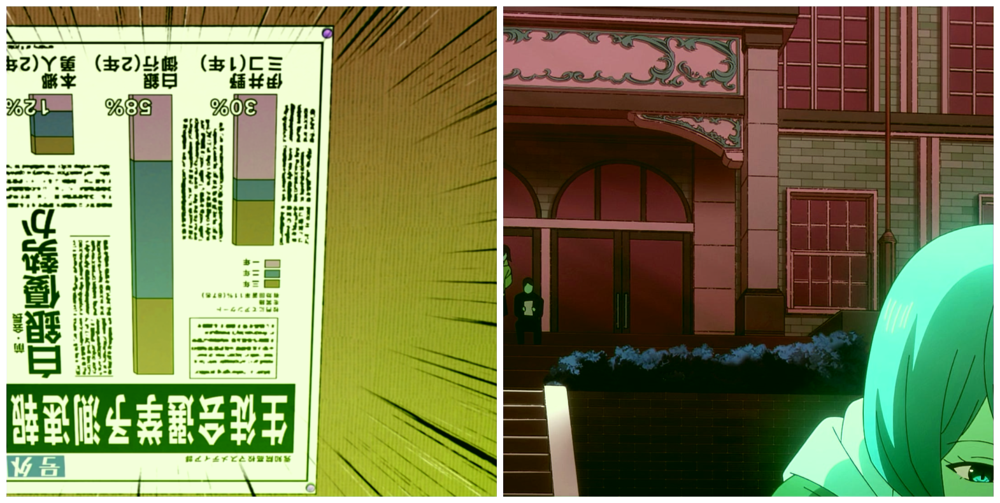

In [72]:
figure = plt.figure(figsize=figsize)
show_images(figure, x_input)


In [35]:
# conv_output_quint8 = model_converted.conv_layers[0](model_converted.quant(inputs))
# F.relu(conv_output_quint8.int_repr() - conv_output_quint8.q_zero_point())

input_quint8 = model_converted.quant(inputs)
conv1_weight = model_converted.state_dict()['conv_layers.0.weight']
conv1_bias = model_converted.state_dict()['conv_layers.0.bias']

input_2 = F.relu(F.conv2d(input_quint8.dequantize(), conv1_weight.dequantize(), conv1_bias, stride=1, padding=1))
conv2_weight = model_converted.state_dict()['conv_layers.1.weight']
conv2_bias = model_converted.state_dict()['conv_layers.1.bias']

intput_3 = F.relu(F.conv2d(input_2, conv2_weight.dequantize(), conv2_bias, stride=1, padding=1))
conv3_weight = model_converted.state_dict()['conv_layers.2.weight']
conv3_bias = model_converted.state_dict()['conv_layers.2.bias']

output = F.conv2d(intput_3, conv3_weight.dequantize(), conv3_bias, stride=1, padding=1)
output


tensor([[[[ 0.4306,  0.4900,  0.5345,  ...,  0.1961,  0.1540,  0.0827],
          [ 0.5168,  0.5400,  0.5624,  ...,  0.2302,  0.2287,  0.1639],
          [ 0.5135,  0.5506,  0.5660,  ...,  0.2305,  0.2320,  0.1923],
          ...,
          [ 0.7301,  0.7712,  0.7476,  ...,  0.6624,  0.7103,  0.6297],
          [ 0.7286,  0.8171,  0.7848,  ...,  0.6847,  0.7157,  0.6693],
          [ 0.5307,  0.6450,  0.6054,  ...,  0.5240,  0.5851,  0.5657]],

         [[ 0.1742,  0.3533,  0.3455,  ...,  0.0869,  0.0355, -0.0063],
          [ 0.3403,  0.3740,  0.3746,  ...,  0.0936,  0.0945,  0.0538],
          [ 0.3110,  0.3208,  0.3394,  ...,  0.0674,  0.0786,  0.0671],
          ...,
          [ 0.5612,  0.6872,  0.6746,  ...,  0.7215,  0.7210,  0.5717],
          [ 0.5719,  0.7469,  0.7116,  ...,  0.7174,  0.7625,  0.6097],
          [ 0.4545,  0.5968,  0.6278,  ...,  0.5978,  0.7337,  0.5112]],

         [[ 0.5637,  0.3597,  0.3603,  ...,  0.1411,  0.1518,  0.1437],
          [ 0.4942,  0.3505,  

In [ ]:
# input_quint8 = model_converted.quant(inputs)

# # conv_output_quint8 = model_converted.conv_layers[0](input_quint8)

# # input: input_quint8

# conv1_weight = model_converted.state_dict()['conv_layers.0.weight']
# conv1_bias = model_converted.state_dict()['conv_layers.0.bias']

# conv_output_float = F.conv2d(input_quint8.dequantize(), conv1_weight.dequantize(), conv1_bias, stride=1, padding=1)

# conv_output_quint8_calc = conv_output_float / model_converted.conv_layers[0].scale + model_converted.conv_layers[0].zero_point


# # relu1 = F.relu(conv_output_quint8)
# # conv_output_quint8_2 = model_converted.conv_layers[1](relu1)
# # relu2 = F.relu(conv_output_quint8_2)
# # conv_output_quint8_3 = model_converted.conv_layers[2](relu2)
# # output_quint8 = model_converted.dequant(conv_output_quint8_3)

# conv_output_quint8 = model_converted.conv_layers[0](input_quint8)

# ret = F.conv2d(conv_output_quint8.int_repr().float(), model_converted.state_dict()['conv_layers.1.weight'].int_repr().float())

# # ret.max() - ret.min() # ~256^2

# model_converted.state_dict()['conv_layers.1.weight'].int_repr().shape
# conv_output_quint8.int_repr().shape
# conv_output_float = conv_output_quint8.dequantize()

# (conv_output_quint8.int_repr() - conv_output_quint8.q_zero_point()) * conv_output_quint8.q_scale()

# conv_output_quint8

# 1 / model_converted.state_dict()['quant.scale']

# # input: float (0, 1) / quant.scale => input_int: int [0, 127]

# # input_int: int [0, 127] conv with conv.weight: int => output_int: int

# # output_int: int * conv.q_per_channel_scales (assuming zero_point is 0) => output_float: float

# # output_float: float / conv.scale + conv.zero_point => output_conv: int

# model_converted.state_dict().keys()

# conv1 = model_converted.state_dict()['conv_layers.0.weight']
# conv1

# conv1.q_per_channel_zero_points()
# conv1.q_per_channel_scales()
# conv1.int_repr() * (conv1.q_per_channel_scales()).unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)

In [ ]:
plt.plot(train_losses)
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
None  # Suppress output.

In [ ]:
# # print min and max of outputs

# print(outputs.min(), outputs.max())
# print(inputs.min(), inputs.max())
# print(targets.min(), targets.max())

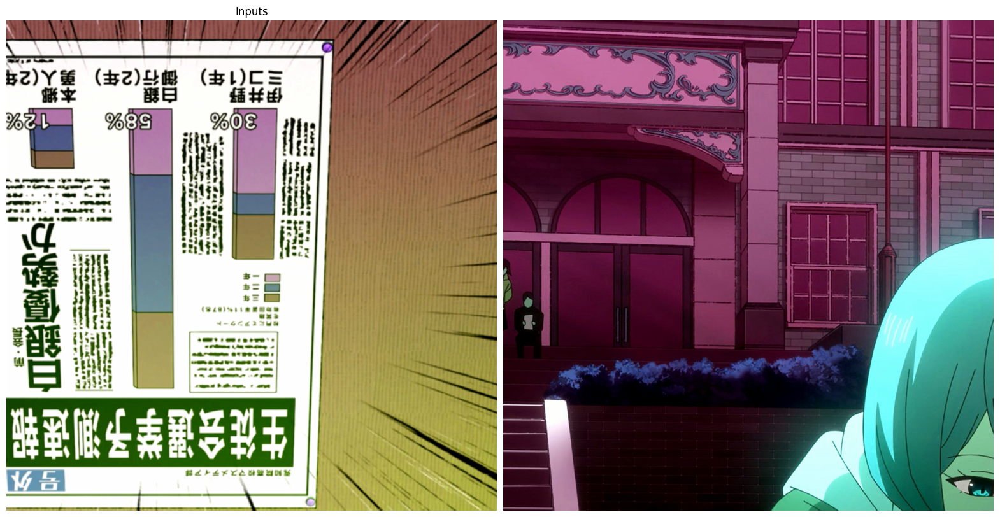

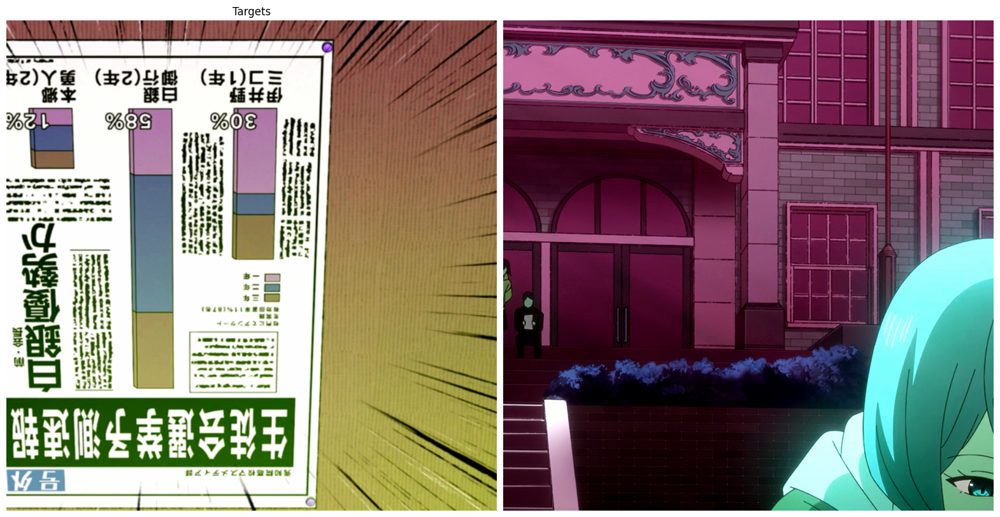

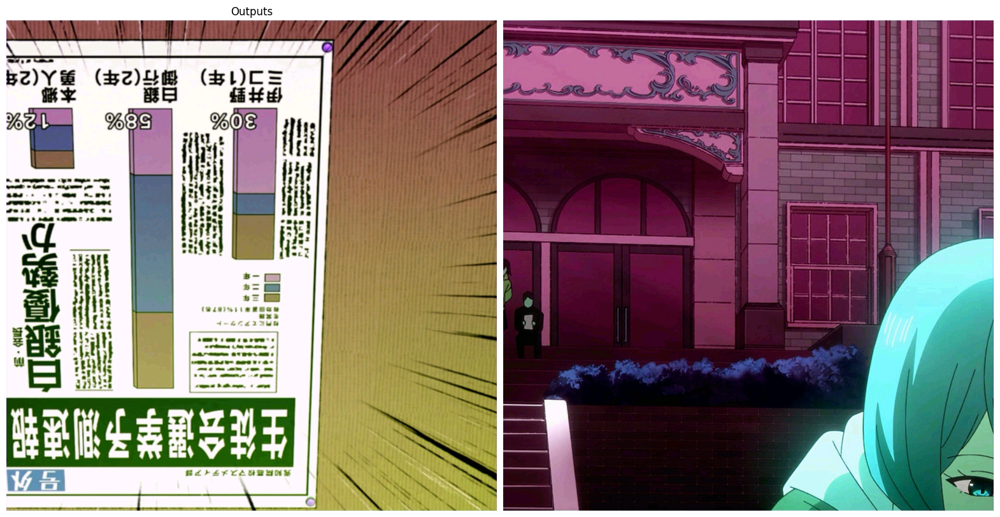

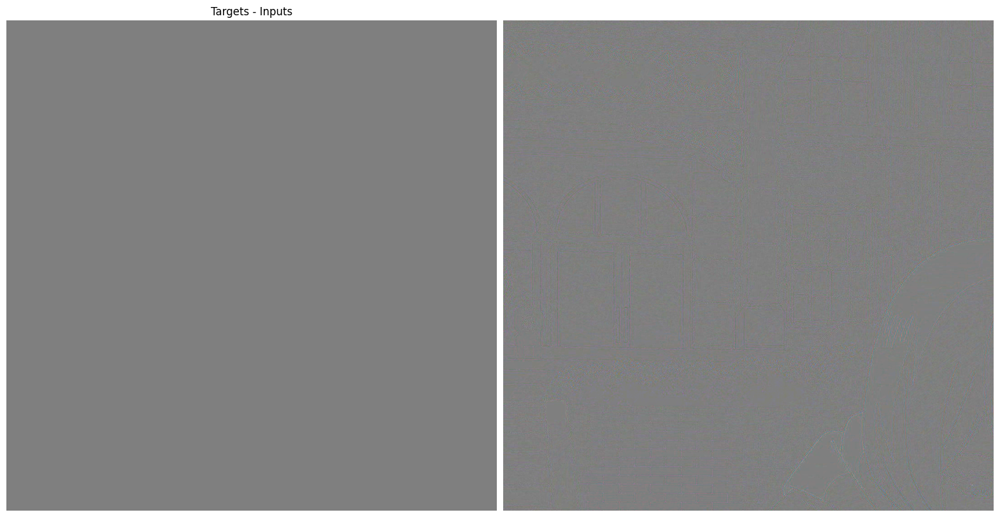

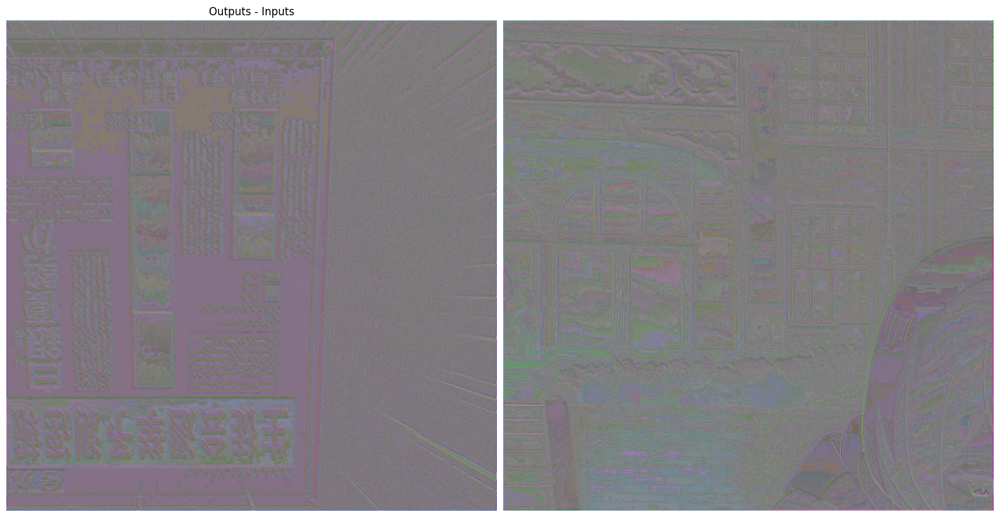

In [10]:
figsize = (20, 20)
model_converted.cpu()

with torch.inference_mode():
    inputs, targets = next(iter(DataLoader(train_set, batch_size=2)))
    model_converted.eval()
    outputs = model_converted(inputs)

figure = plt.figure(figsize=figsize)
show_images(figure, inputs)
figure.axes[0].set_title("Inputs")

figure = plt.figure(figsize=figsize)
show_images(figure, targets)
figure.axes[0].set_title("Targets")

figure = plt.figure(figsize=figsize)
show_images(figure, outputs)
figure.axes[0].set_title("Outputs")

upsampled_inputs = F.interpolate(inputs, scale_factor=1, mode="bilinear")

figure = plt.figure(figsize=figsize)
show_images(figure, targets - upsampled_inputs, value_range=(-0.2, 0.2))
figure.axes[0].set_title("Targets - Inputs")

figure = plt.figure(figsize=figsize)
show_images(figure, outputs - upsampled_inputs, value_range=(-0.2, 0.2))
figure.axes[0].set_title("Outputs - Inputs")

None  # Suppress output.

In [ ]:
print(model)
print(
    "Number of conv parameters:",
    sum(v.numel() for k, v in model.state_dict().items() if k.endswith(".weight")),
)

In [ ]:
# #!/bin/bash

# # Loop through all video files in the current directory
# for file in *.mp4 *.avi *.mov; do
#     # Check if the file exists
#     if [ -e "$file" ]; then
#         # Extract the base filename and extension
#         filename=$(basename "$file")
#         extension="${filename##*.}"
#         filename="${filename%.*}"

#         # Resize the video to 10% of its original size and scale it back to the original size
#         ffmpeg -i "$file" -vf "scale=iw*0.1:ih*0.1,scale=iw*10:ih*10" "${filename}_10.${extension}"

#         echo "Processed $file"
#     fi
# done

In [ ]:
# for file in *.png; do
#     if [ -e "$file" ]; then
#         filename=$(basename "$file" .png)
#         convert "$file" -resize 10% -resize 1000% "${filename}_10.png"
#         echo "Processed $file"
#     fi
# done